# Mask R-CNN - Inspect Leaves Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("../../../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import importlib
module_name = "samples.plants_to_leaf_area.04-model.src.leaves_model"
leaves_model_module = importlib.import_module(module_name)
leaves_model = leaves_model_module
# from samples.plants_to_leaf_area.04-model.src.leaves_model import leaves_model

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to Leaves trained weights
LEAVES_MODEL_WEIGHTS_PATH = os.path.join(ROOT_DIR, "logs/leaves_model_baseline/mask_rcnn_leaves_model_0039.h5")  # TODO: update this path


Using TensorFlow backend.


Instructions for updating:
Use the retry module or similar alternatives.


## Configurations

In [2]:
config = leaves_model.LeavesConfig()
LEAVES_MODEL_DIR = os.path.join(ROOT_DIR, "samples/plants_to_leaf_area/04-model/data")

In [3]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Notebook Preferences

In [4]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [5]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Load Validation Dataset

In [6]:
# Load validation dataset
dataset = leaves_model.LeavesDataset()
dataset.load_leaves(LEAVES_MODEL_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 10
Classes: ['BG', 'leaf']


## Display Samples

0
image ID: leaf.08-19-2022 19;15;00.JPG (0) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/08-19-2022 19;15;00.JPG


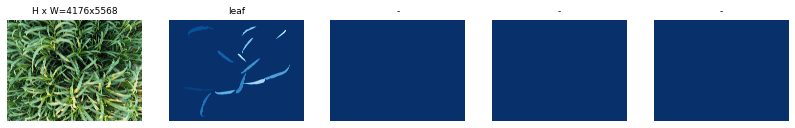

1
image ID: leaf.2023-01-31_08.jpg (1) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/2023-01-31_08.jpg


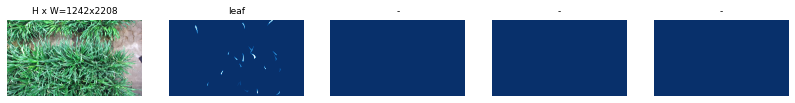

2
image ID: leaf.09-16-2022 06;53;25.JPG (2) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/09-16-2022 06;53;25.JPG


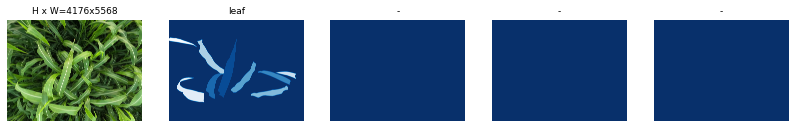

3
image ID: leaf.projected_image_2023-01-30_08.00.00_png_ultra.jpg (3) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/projected_image_2023-01-30_08.00.00_png_ultra.jpg


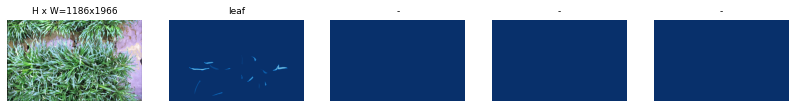

4


image ID: leaf.08-06-2022 14;30;00.JPG (4) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/08-06-2022 14;30;00.JPG


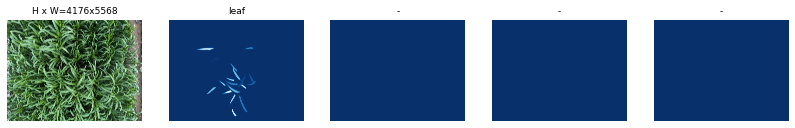

5
image ID: leaf.2023-01-21_20.jpg (5) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/2023-01-21_20.jpg


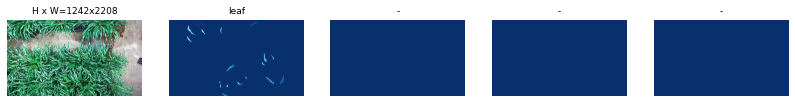

6
image ID: leaf.09-09-2022 18;51;15.JPG (6) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/09-09-2022 18;51;15.JPG


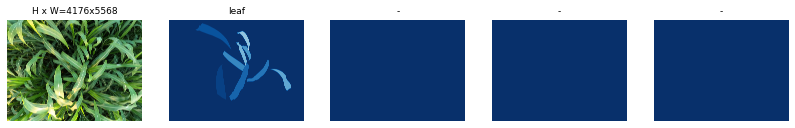

7
image ID: leaf.08-13-2022 19;00;00.JPG (7) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/08-13-2022 19;00;00.JPG


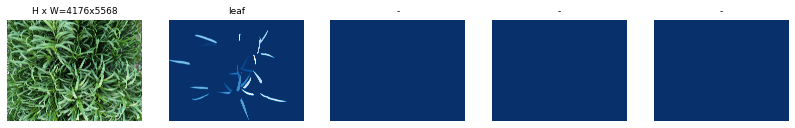

8
image ID: leaf.09-02-2022 07;30;00.JPG (8) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/09-02-2022 07;30;00.JPG


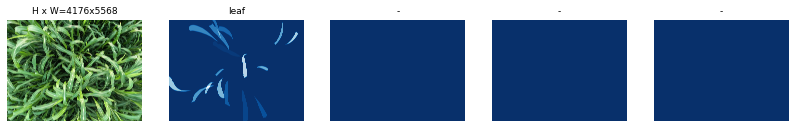

9
image ID: leaf.08-26-2022 06;30;00.JPG (9) /hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/08-26-2022 06;30;00.JPG


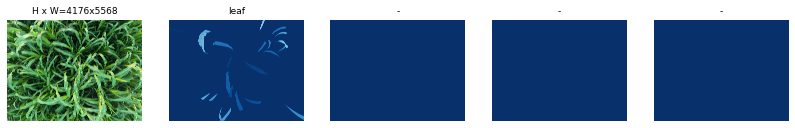

In [7]:
image_ids = dataset.image_ids
for image_id in image_ids:
    print(image_id)
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

## Load Model

In [8]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [9]:
print(LEAVES_MODEL_WEIGHTS_PATH)
print(model.find_last())

# Set path to leaves_model weights file
weights_path = LEAVES_MODEL_WEIGHTS_PATH

# Or, load the last model you trained
# weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

/hdd/gros2/maskrcnn/logs/leaves_model_baseline/mask_rcnn_leaves_model_0039.h5
/hdd/gros2/maskrcnn/logs/leaves_model_baseline_new/mask_rcnn_leaves_model_0029.h5
Loading weights  /hdd/gros2/maskrcnn/logs/leaves_model_baseline/mask_rcnn_leaves_model_0039.h5


## Run Detection

{'id': '2023-01-31_08.jpg', 'source': 'leaf', 'path': '/hdd/gros2/maskrcnn/samples/plants_to_leaf_area/04-model/data/val/2023-01-31_08.jpg', 'width': 2208, 'height': 1242, 'polygons': [{'name': 'polygon', 'all_points_x': [1116, 1118, 1119, 1126, 1134, 1143, 1150, 1158, 1159, 1160, 1146, 1142, 1133, 1119, 1117, 1117, 1115], 'all_points_y': [1073, 1071, 1062, 1046, 1027, 1017, 1016, 1012, 1013, 1028, 1043, 1051, 1063, 1078, 1080, 1088, 1088]}, {'name': 'polygon', 'all_points_x': [1161, 1161, 1163, 1167, 1168, 1173, 1182, 1176, 1180, 1172, 1166], 'all_points_y': [1061, 1008, 989, 992, 1003, 1023, 1053, 1057, 1064, 1066, 1065]}, {'name': 'polygon', 'all_points_x': [1292, 1293, 1296, 1296, 1303, 1302, 1291, 1281, 1277, 1270, 1259, 1242, 1222, 1222, 1238, 1249, 1258, 1272], 'all_points_y': [1179, 1171, 1166, 1160, 1152, 1150, 1152, 1154, 1156, 1155, 1151, 1144, 1136, 1138, 1147, 1154, 1165, 1172]}, {'name': 'polygon', 'all_points_x': [1828, 1826, 1819, 1809, 1802, 1800, 1809, 1811, 1810, 181

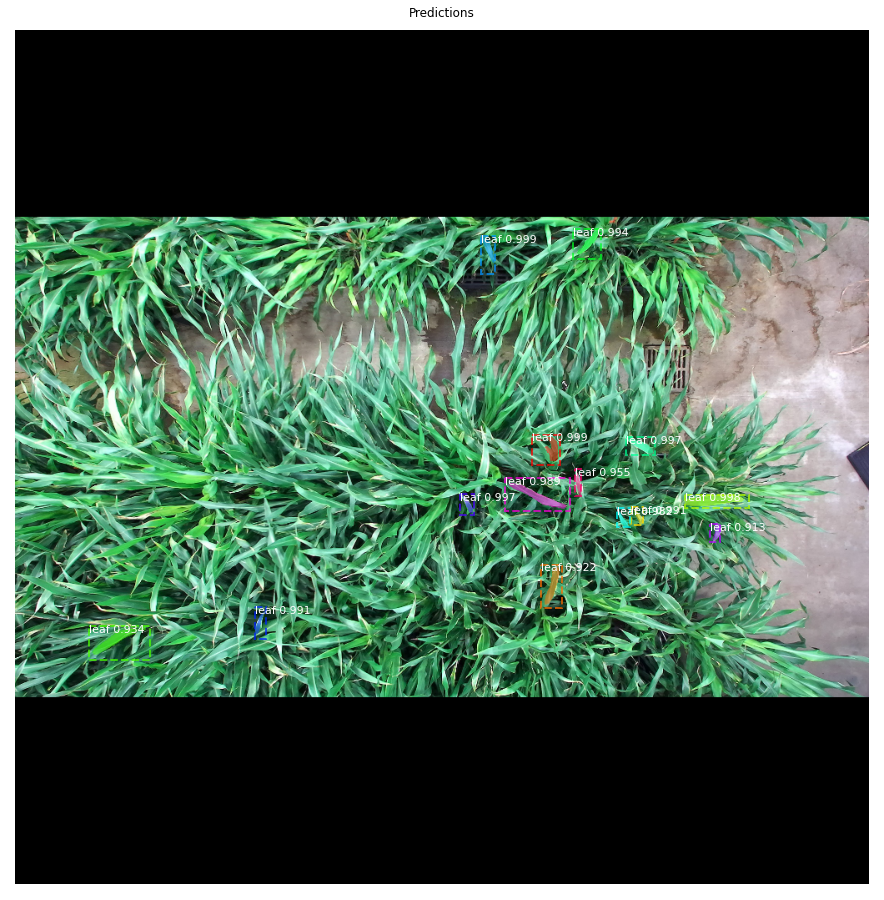

gt_class_id              shape: (21,)                 min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (21, 4)               min:  196.00000  max:  848.00000  int32
gt_mask                  shape: (1024, 1024, 21)      min:    0.00000  max:    1.00000  bool


In [10]:
# image_id = random.choice(dataset.image_ids)
# print(dataset.image_ids)
image_id = 1
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print(info)
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

### Precision-Recall

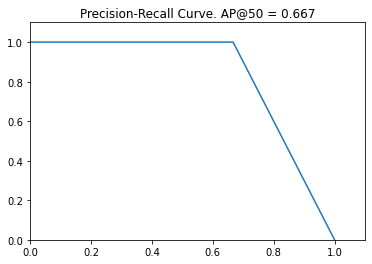

In [11]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0)
visualize.plot_precision_recall(AP, precisions, recalls)

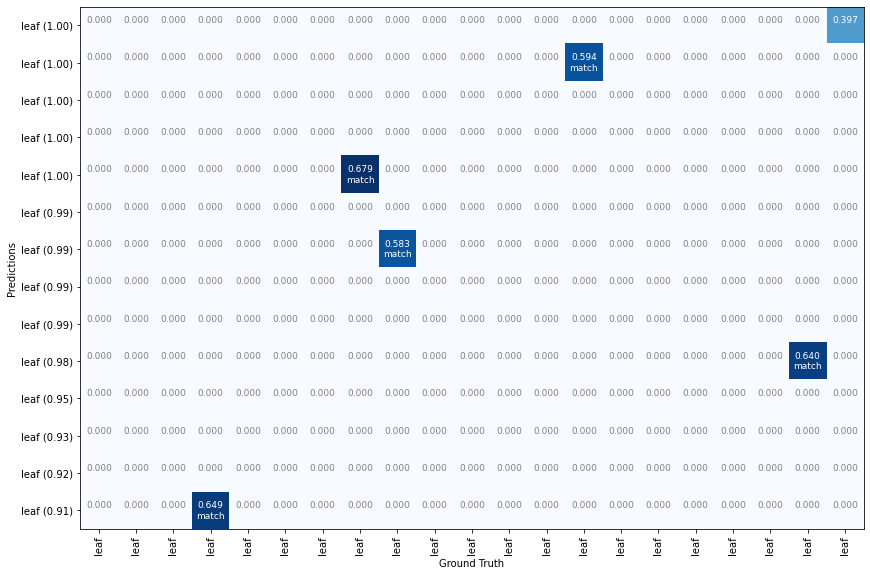

In [12]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

### Computer mAP @ IoU=50 on Batch of Images

In [13]:
# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'])
        APs.append(AP)
    return APs

# Pick a set of random images
image_ids = np.random.choice(dataset.image_ids, 10)
APs = compute_batch_ap(image_ids)
print("mAP @ IoU=50: ", np.mean(APs))

aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa


aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa
aaaaaaaaaaaaaaaaaaa
mAP @ IoU=50:  0.22017562764725002


### More Visualizations of Detection

aaaaaaaaaaaaaaaaaaa
Ground Truth:


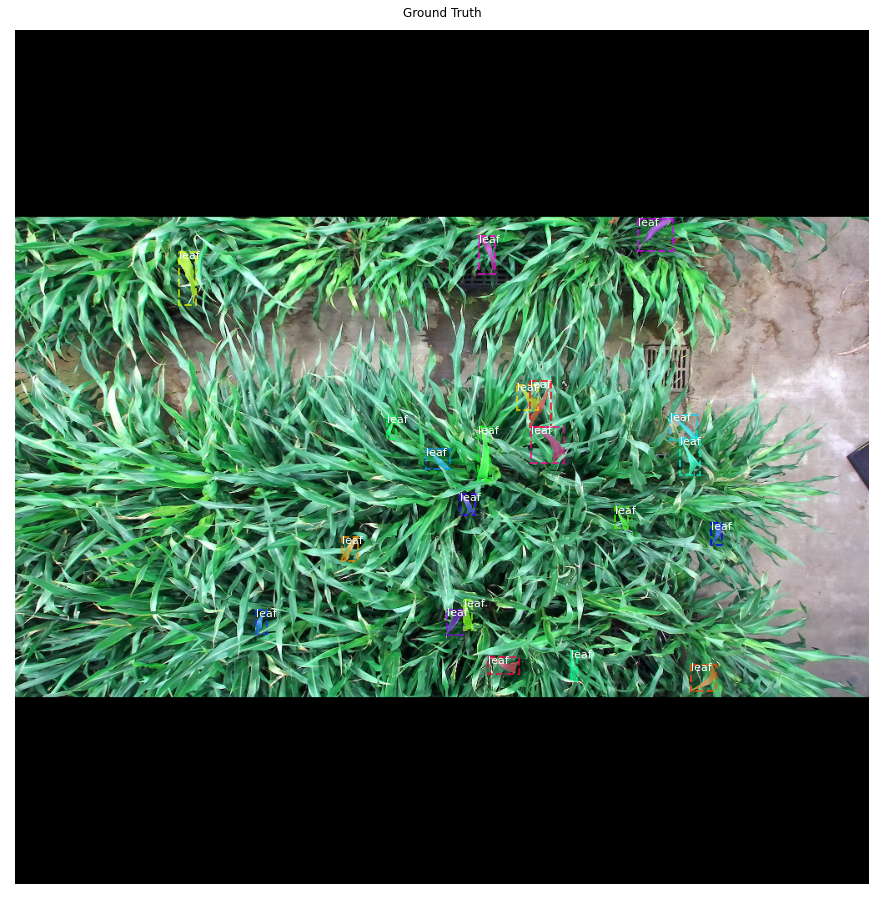

Ground Truth and Predictions:


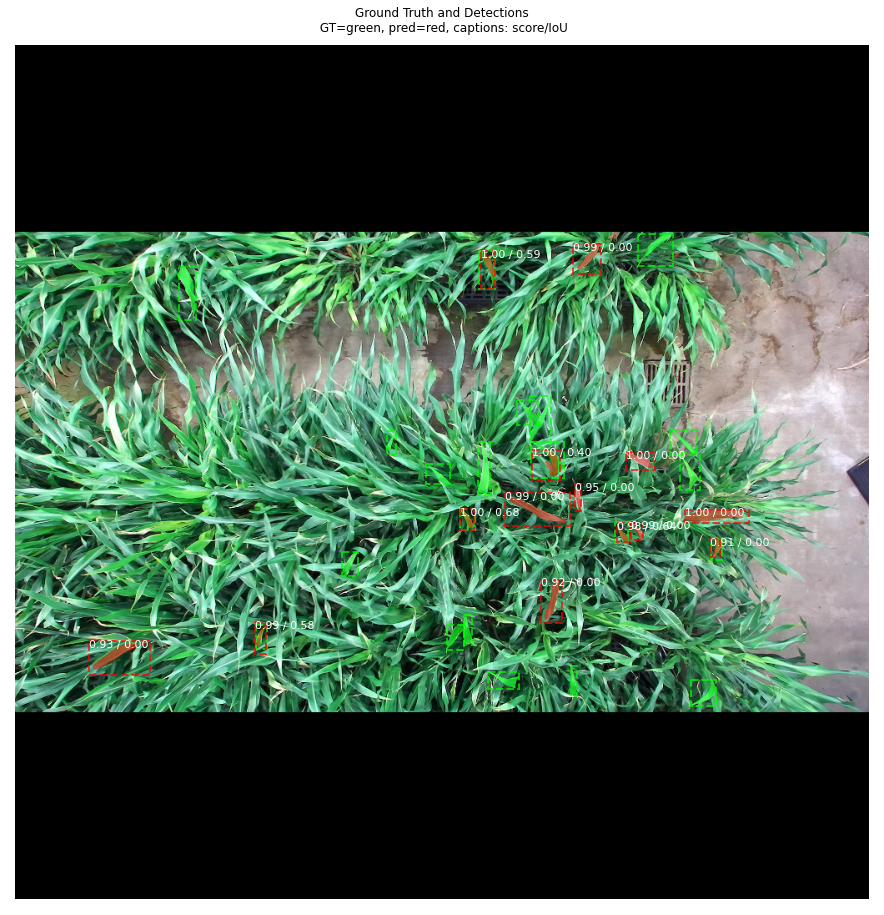

Ground Truth and Predictions:


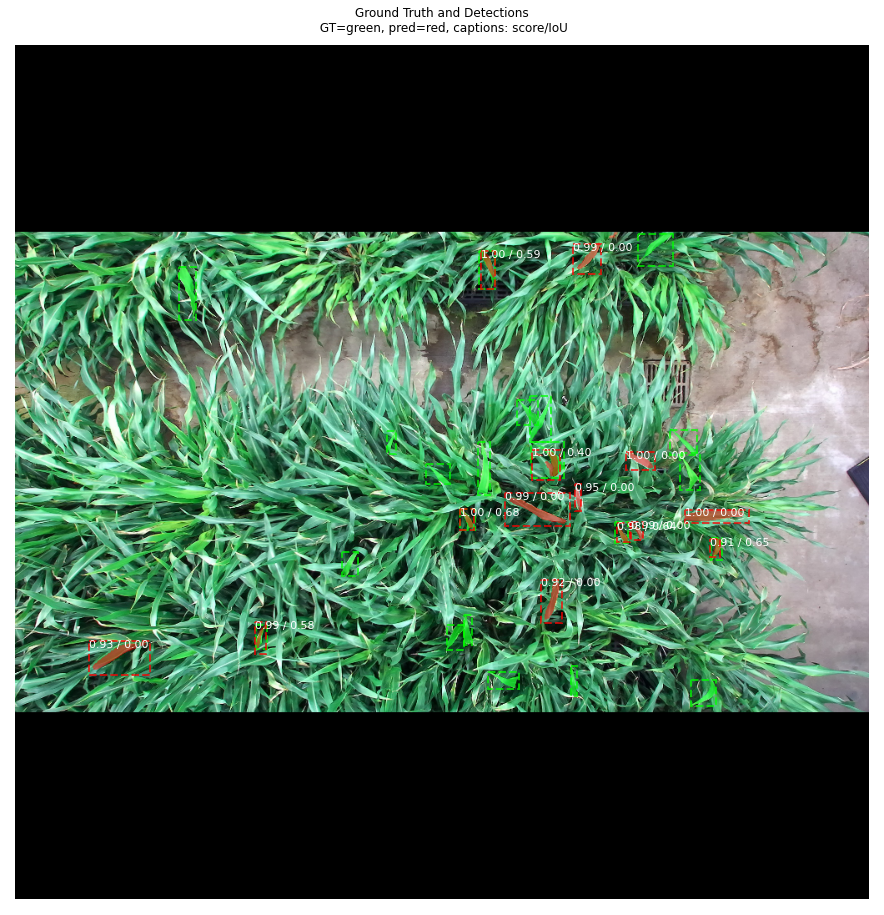

Ground Truth and Predictions:


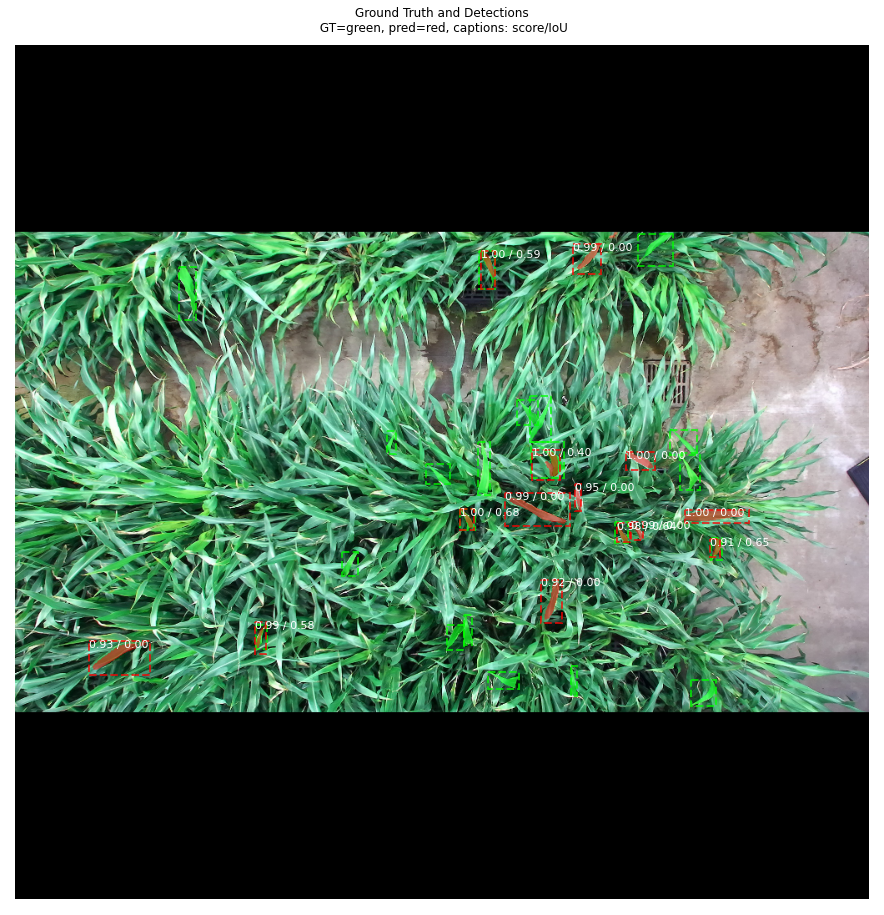

Ground Truth and Predictions:


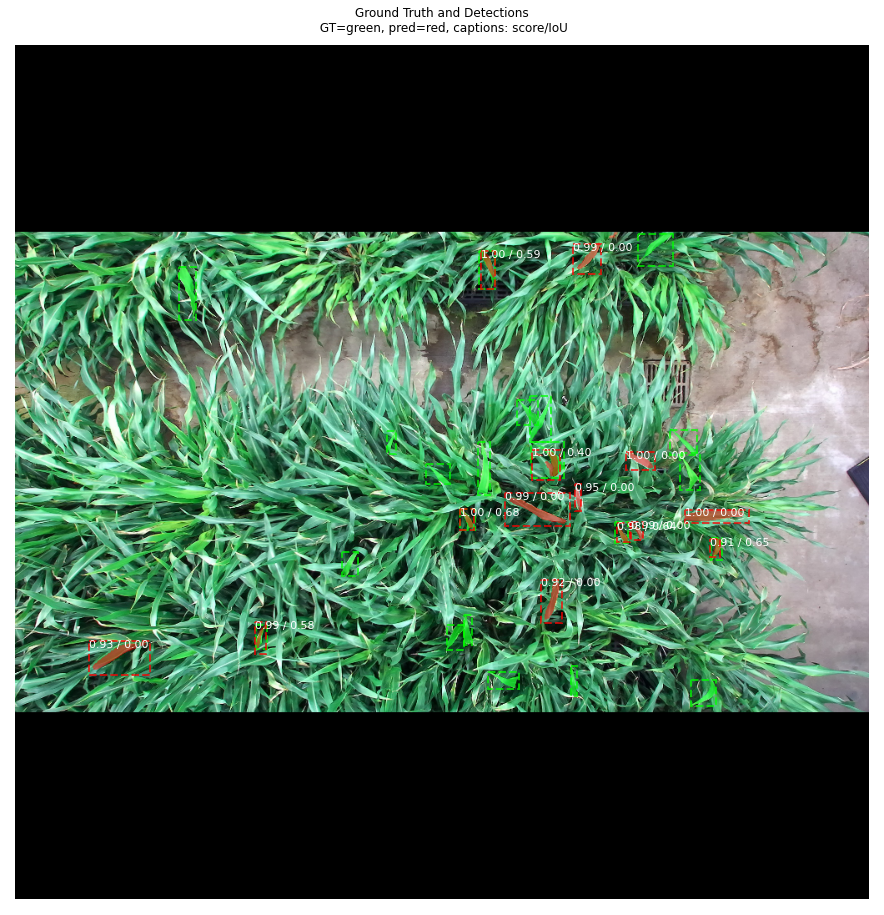

In [18]:
image_id = 1
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]

results = model.detect([image], verbose=0)
r = results[0]

# Display Ground Truth only
print("Ground Truth:")
visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id, 
                            dataset.class_names, ax=get_ax(1),
                            show_bbox=True, show_mask=True,
                            title="Ground Truth")

# Compute AP over range 0.5 to 0.95 and print it
# utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
#                        r['rois'], r['class_ids'], r['scores'], r['masks'],
#                        verbose=1)

print("Ground Truth and Predictions:")
visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset.class_names, ax=get_ax(),
    show_box=True, show_mask=True,
    iou_threshold=0, score_threshold=0)

print("Ground Truth and Predictions:")
visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset.class_names, ax=get_ax(),
    show_box=True, show_mask=True,
    iou_threshold=0, score_threshold=0.5)

print("Ground Truth and Predictions:")
visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset.class_names, ax=get_ax(),
    show_box=True, show_mask=True,
    iou_threshold=0.5, score_threshold=0.5)

print("Ground Truth and Predictions:")
visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset.class_names, ax=get_ax(),
    show_box=True, show_mask=True,
    iou_threshold=0, score_threshold=0.8)
# # Compute matches between prediction and ground truth instances
# gt_match, pred_match, overlaps = utils.compute_matches(
#     gt_boxes, gt_class_ids, gt_masks, pred_boxes, pred_class_ids, pred_scores, pred_masks, iou_threshold=0.5, score_threshold=0.0
# )
# pred_boxes = overlaps[0]
# gt_boxes = overlaps[1]


# # Computer Average Precision
# mAP, precisions, recalls, overlaps = utils.compute_ap(
#     gt_boxes, gt_class_ids, gt_masks, pred_boxes, pred_class_ids, pred_scores, pred_masks, iou_threshold=0.5
# )


# # Computer Average Precision over IoU Range
# AP = utils.compute_ap_range(
#     gt_box, gt_class_id, gt_mask, pred_box, pred_class_id, pred_score, pred_mask, iou_thresholds=None, verbose=1
# )


# # Computer Recall
# recall, positive_ids = utils.compute_recall(pred_boxes, gt_boxes, iou)




# visualize.plot_precision_recall(AP, precisions, recalls)

# visualize.plot_overlaps(gt_class_ids, pred_class_ids, pred_scores, overlaps, dataset.class_names, threshold=0.5)








# Compute AP for cutrrent image
# AP, precisions, recalls, overlaps = utils.compute_ap(
#     gt_bbox, gt_class_id, gt_mask,
#     r['rois'], r['class_ids'], r['scores'], r['masks']
# )
# print("AP for current image: ", AP)
# print("Precision for current image: ", precisions)
# print("Recalls for current image: ", recalls)
# print("Overlaps for current image: ", overlaps[0], " next ", overlaps[1])


##############################################



In [ ]:
## Average Precision, mean precision and mean recalls  for Dataset

APs = []
all_precisions = []
all_recalls = []
for image_id in dataset.image_ids:
    # Load image and ground truth data
    image, _, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    
    # Compute AP
    AP, precisions, recalls, overlaps = utils.compute_ap(
        gt_bbox, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0.0
    )
    # visualize.plot_precision_recall(AP, precisions, recalls)
    # print("AP for current image: ", AP)
    # print("Precision for current image: ", precisions)
    # print("Recalls for current image: ", recalls)
    # print("Overlaps for current image: ", overlaps[0], " next ", overlaps[1])
    APs.append(AP)
    all_precisions.append(np.mean(precisions))
    all_recalls.append(np.mean(recalls))

mAP = np.mean(APs)
print("mAP over the dataset: ", mAP)

# Compute mean Recall and precision across all detected objects
mean_precisions = np.mean(all_precisions)
print("Mean Precision across the dataset: ", mean_precisions)
mean_recall = np.mean(all_recalls)
print("Mean Recall across the dataset: ", mean_recall)


## Average Precision, mean precision and mean recalls  for Dataset

APs = []
all_precisions = []
all_recalls = []
for image_id in dataset.image_ids:
    # Load image and ground truth data
    image, _, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    
    # Compute AP
    AP, precisions, recalls, overlaps = utils.compute_ap(
        gt_bbox, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0.5
    )
    # visualize.plot_precision_recall(AP, precisions, recalls)
    # print("AP for current image: ", AP)
    # print("Precision for current image: ", precisions)
    # print("Recalls for current image: ", recalls)
    # print("Overlaps for current image: ", overlaps[0], " next ", overlaps[1])
    APs.append(AP)
    all_precisions.append(np.mean(precisions))
    all_recalls.append(np.mean(recalls))

mAP = np.mean(APs)
print("mAP over the dataset: ", mAP)

# Compute mean Recall and precision across all detected objects
mean_precisions = np.mean(all_precisions)
print("Mean Precision across the dataset: ", mean_precisions)
mean_recall = np.mean(all_recalls)
print("Mean Recall across the dataset: ", mean_recall)



## Average Precision, mean precision and mean recalls  for Dataset

APs = []
all_precisions = []
all_recalls = []
for image_id in dataset.image_ids:
    # Load image and ground truth data
    image, _, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    
    # Compute AP
    AP, precisions, recalls, overlaps = utils.compute_ap(
        gt_bbox, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0.8
    )
    # visualize.plot_precision_recall(AP, precisions, recalls)
    # print("AP for current image: ", AP)
    # print("Precision for current image: ", precisions)
    # print("Recalls for current image: ", recalls)
    # print("Overlaps for current image: ", overlaps[0], " next ", overlaps[1])
    APs.append(AP)
    all_precisions.append(np.mean(precisions))
    all_recalls.append(np.mean(recalls))

mAP = np.mean(APs)
print("mAP over the dataset: ", mAP)

# Compute mean Recall and precision across all detected objects
mean_precisions = np.mean(all_precisions)
print("Mean Precision across the dataset: ", mean_precisions)
mean_recall = np.mean(all_recalls)
print("Mean Recall across the dataset: ", mean_recall)

#### IoU for Dataset


def compute_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both bounding boxes
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the IoU
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

# List to store all IoU values
all_ious = []
all_ious_2 = []

# Iterate over all images in the dataset
for image_id in dataset.image_ids:
    # Load image and ground truth data
    image, _, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]

    # Compute IoU for each detected object
    for pred_box, gt_box in zip(r['rois'], gt_bbox):
        iou = compute_iou(pred_box, gt_box)
        all_ious.append(iou)

    AP, precisions, recalls, overlaps = utils.compute_ap(
        gt_bbox, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'], iou_threshold=0.8
    )
    for pred_box, gt_box in zip(overlaps[0], overlaps[1]):
        iou = compute_iou(pred_box, gt_box)
        all_ious_2.append(iou)

# Compute mean IoU across all detected objects
mean_iou = np.mean(all_ious)
print("Mean IoU across the dataset: ", mean_iou)


mean_iou_2 = np.mean(all_ious_2)
print("Mean IoU 2 across the dataset: ", mean_iou_2)

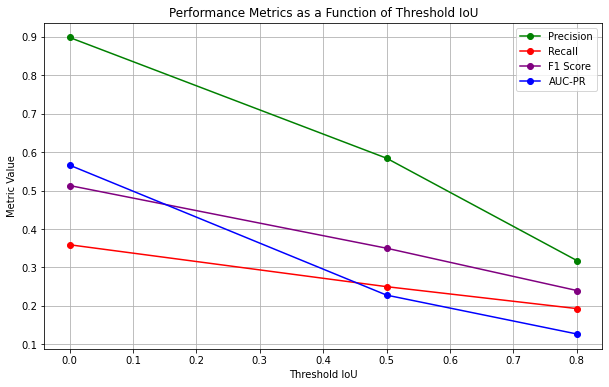

In [14]:
import matplotlib.pyplot as plt

# Data for plotting
threshold_iou = [0, 0.5, 0.8]
auc_pr = [0.566, 0.228, 0.127]
precision = [0.898, 0.584, 0.318]
recall = [0.359, 0.250, 0.193]
f1_score = [0.513, 0.350, 0.240]

# Creating the plot
plt.figure(figsize=(10, 6))
plt.plot(threshold_iou, precision, label='Precision', marker='o', color='green')
plt.plot(threshold_iou, recall, label='Recall', marker='o', color='red')
plt.plot(threshold_iou, f1_score, label='F1 Score', marker='o', color='purple')
plt.plot(threshold_iou, auc_pr, label='AUC-PR', marker='o', color='blue')

# Adding titles and labels
plt.title('Performance Metrics as a Function of Threshold IoU')
plt.xlabel('Threshold IoU')
plt.ylabel('Metric Value')
plt.legend()

# Display the plot with distinct colors
plt.grid(True)
plt.show()


## Color Splash

This is for illustration. You can call `leaves_model.py` with the `splash` option to get better images without the black padding.

aaaaaaaaaaaaaaaaaaa
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


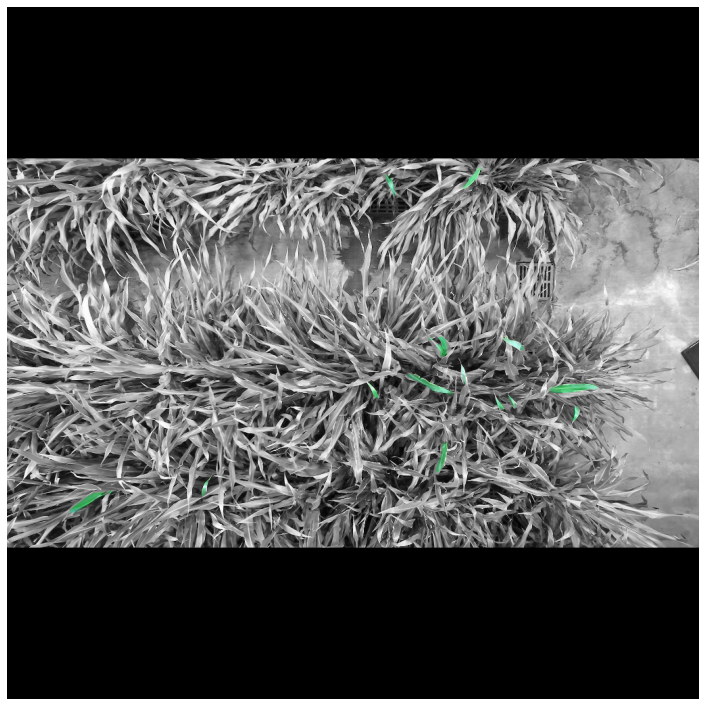

In [15]:
image_id = 1
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]

# Run object detection
results = model.detect([image], verbose=1)
r = results[0]

splash = leaves_model.color_splash(image, r['masks'])
display_images([splash], cols=1)

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [16]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -5.86626  max:    2.87262  float64
positive_anchors         shape: (128, 4)              min:  196.68629  max:  855.31371  float64
negative_anchors         shape: (128, 4)              min:  -90.50967  max: 1141.01934  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (128, 4)              min:  196.00000  max:  848.00000  float32


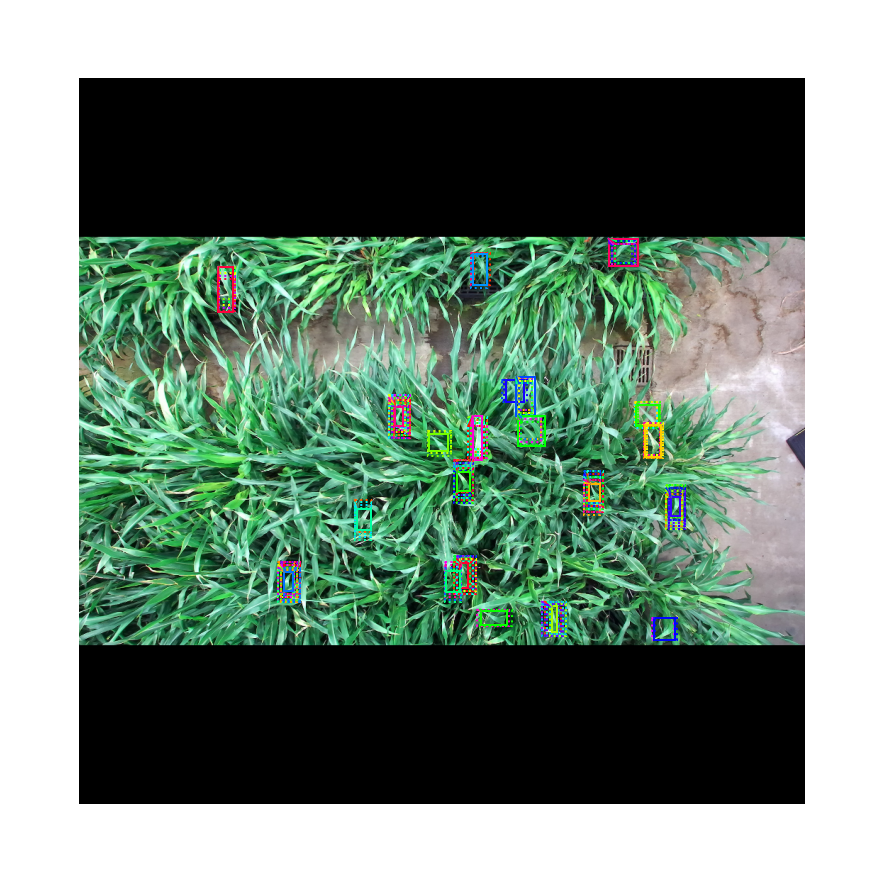

In [17]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [18]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.04109  max:    1.04109  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.00485  max:    0.99220  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    0.99220  float32
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 4457.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    0.96453  float32


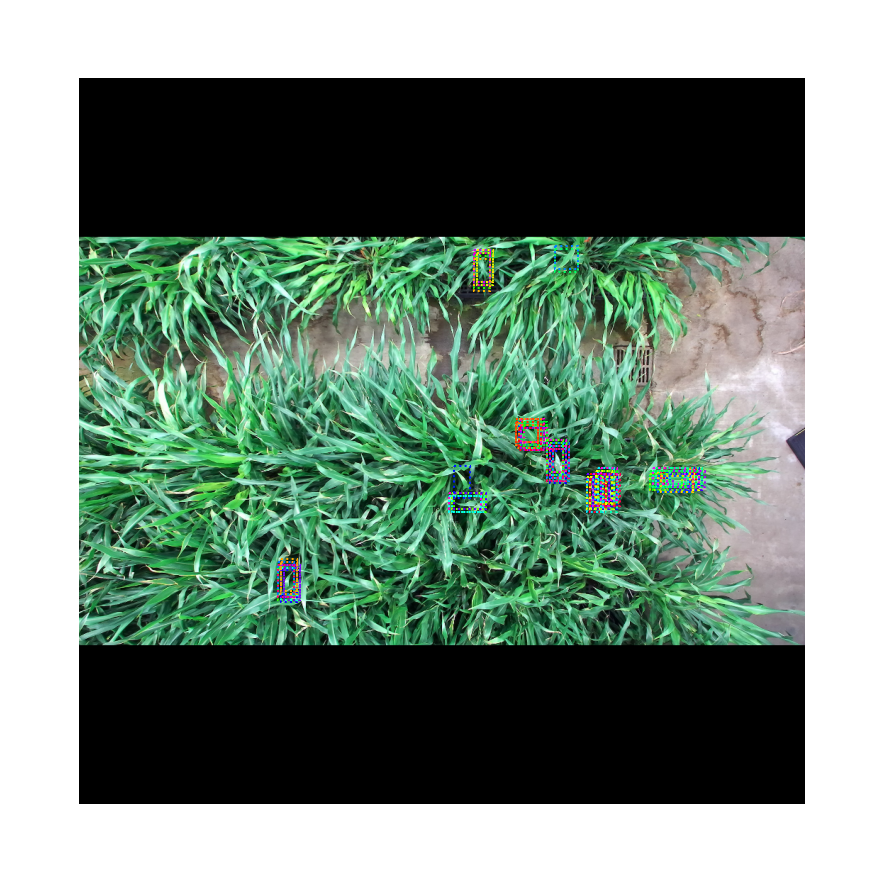

In [19]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

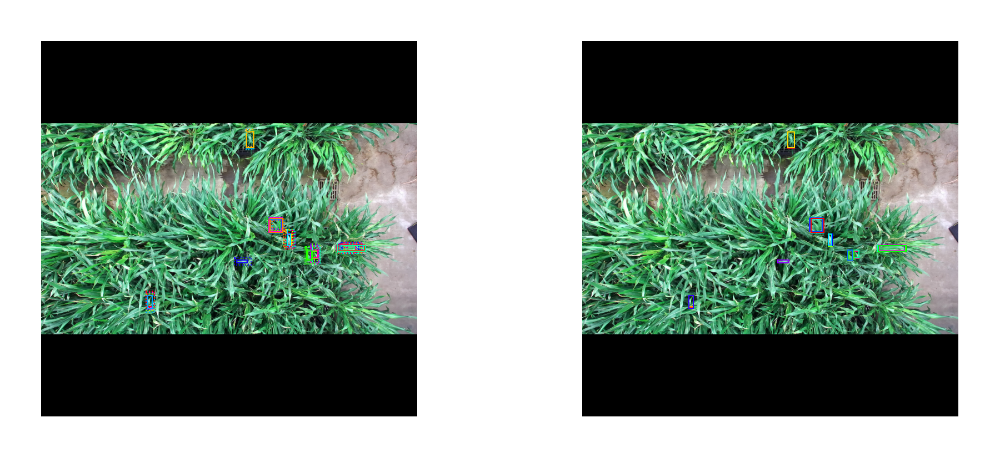

In [20]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

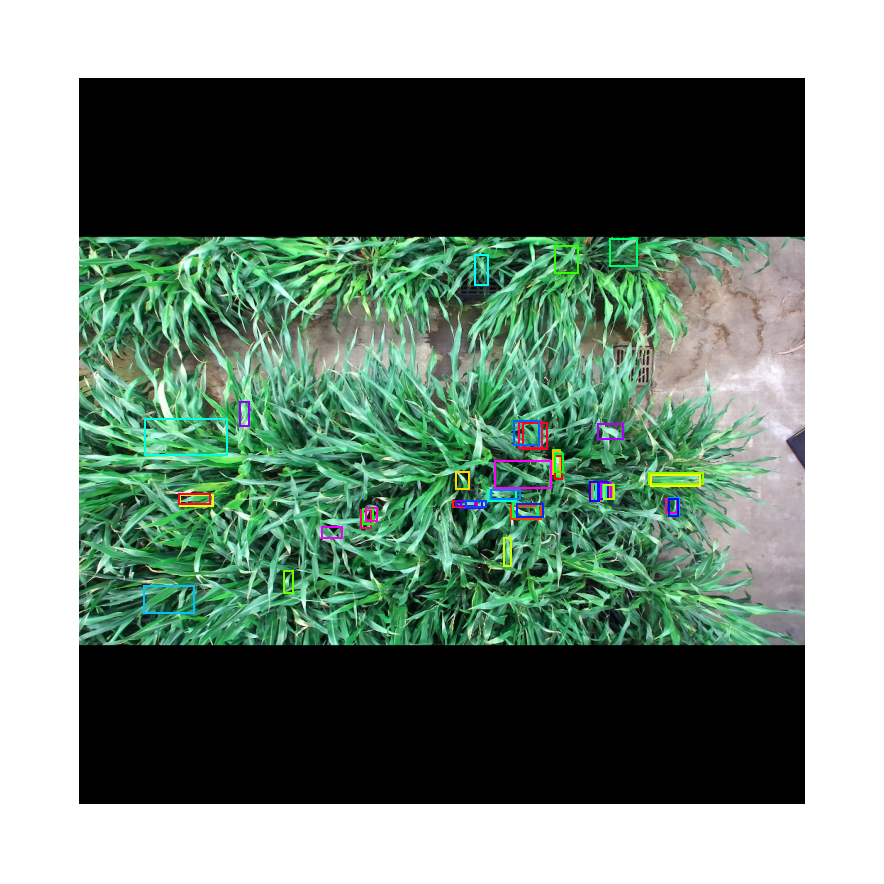

In [21]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

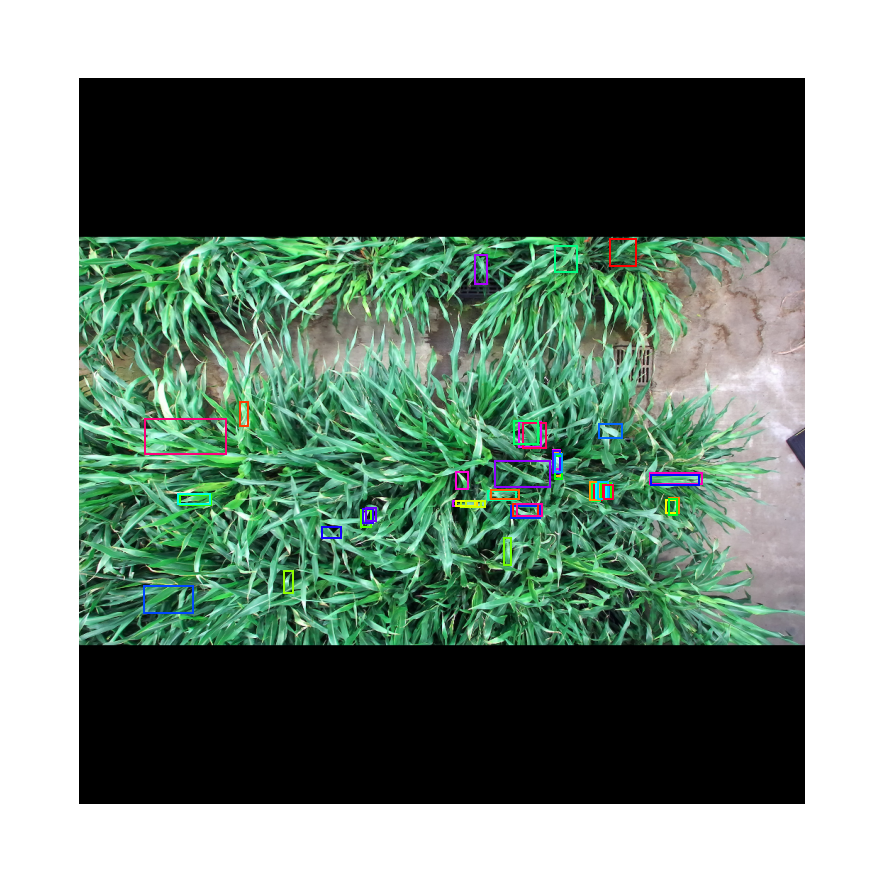

In [22]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [23]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.7

recall, positive_anchor_ids = utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))


All Anchors (261888)       Recall: 0.286  Positive anchors: 17
Refined Anchors ( 6000)   Recall: 0.000  Positive anchors: 0
Post NMS Anchors (   50)  Recall: 0.190  Positive anchors: 5


## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [24]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    0.96453  float32
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 2, 4)       min:   -4.01459  max:    3.98313  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    0.99999  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32


14 detections: ['leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf'
 'leaf' 'leaf' 'leaf' 'leaf']


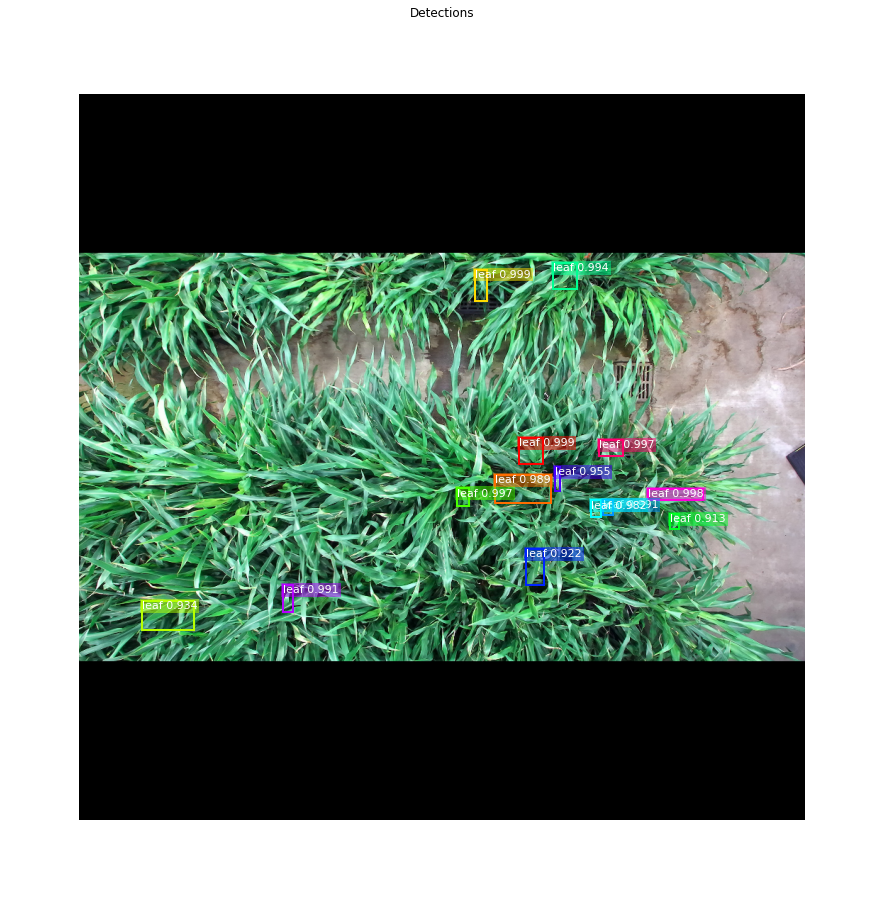

In [25]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [26]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
133 Positive ROIs
[('BG', 867), ('leaf', 133)]


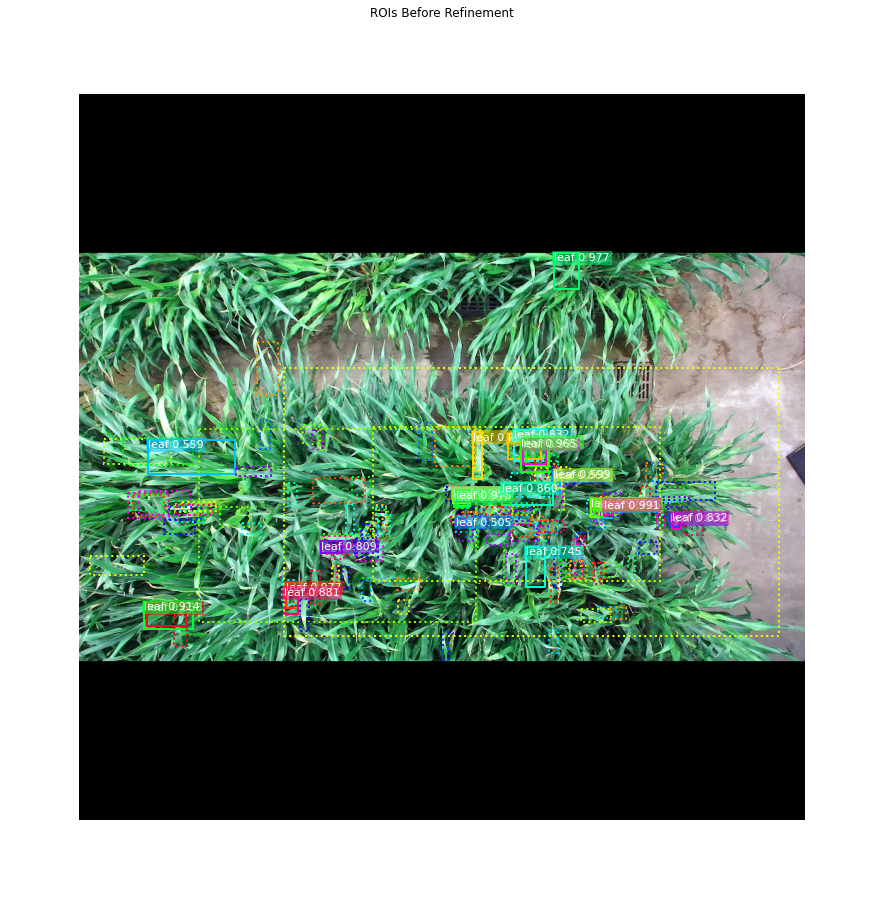

In [27]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -3.23464  max:    2.37605  float32
refined_proposals        shape: (1000, 4)             min:    5.00000  max:  905.00000  int32


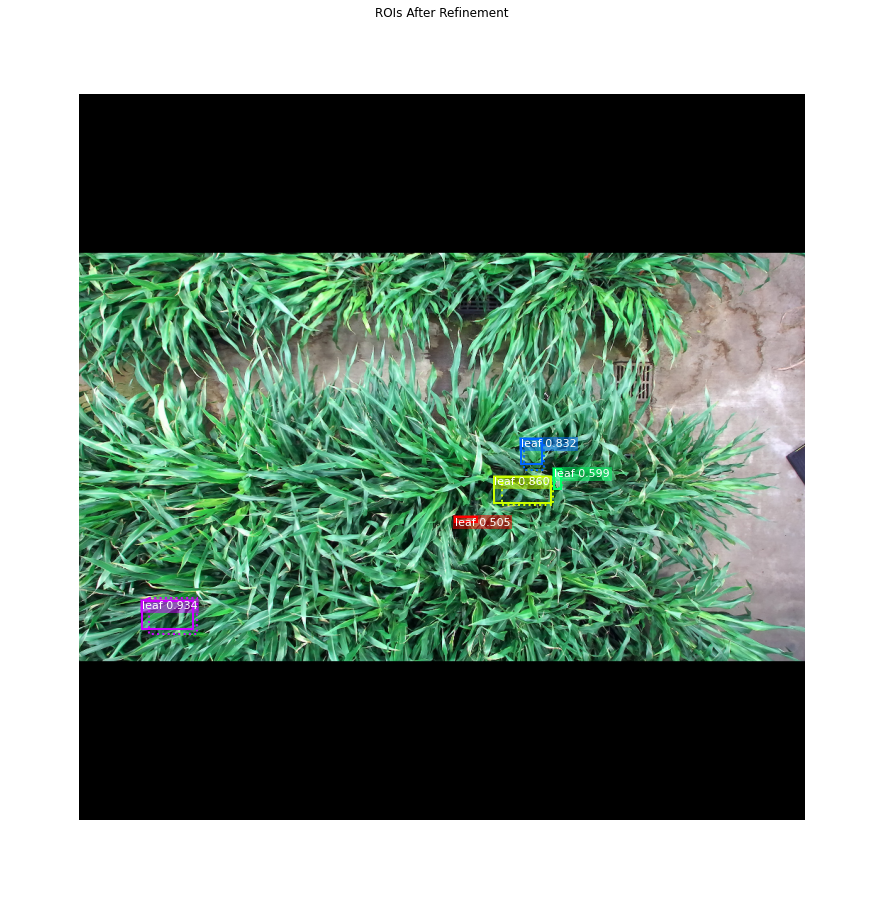

In [28]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [29]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 133 detections:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  19  20  21  22  23  24  25  26  27  28  30  32  34  35  37  42  45  48
  51  52  55  61  64  65  67  69  70  71  72  74  76  80  84  86  87 100
 104 105 113 118 128 136 137 144 148 151 173 175 177 188 196 197 203 208
 215 223 226 228 247 249 257 268 277 278 286 290 291 307 315 327 329 330
 335 359 364 367 373 382 400 405 406 411 431 432 438 448 469 499 541 543
 551 554 563 578 590 591 639 694 718 738 765 789 828 831 836 854 882 895
 899 911 912 914 966 985 988]


In [30]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 67:
[  0   1   2   3   4   5   6   8   9  11  13  14  15  16  17  20  24  27
  28  32  45  61  70  71  74  80  86  87 100 104 105 113 118 128 137 173
 177 196 208 247 249 257 278 290 291 307 315 327 329 330 359 373 405 411
 432 438 448 541 543 551 554 578 591 738 911 914 985]


#### Per-Class Non-Max Suppression

In [31]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

leaf                  : [  0   1   2   3   4   5   6   8   9  11  13  14  15  16  17  20  24  27
  28  32  45  61  70  71  74  80  86  87 100 104 105 113 118 128 137 173
 177 196 208 247 249 257 278 290 291 307 315 327 329 330 359 373 405 411
 432 438 448 541 543 551 554 578 591 738 911 914 985] -> [  2   5   0  16  14 432  61   4  17   8   3 543 405  20]

Kept after per-class NMS: 14
[  0   2   3   4   5   8  14  16  17  20  61 405 432 543]


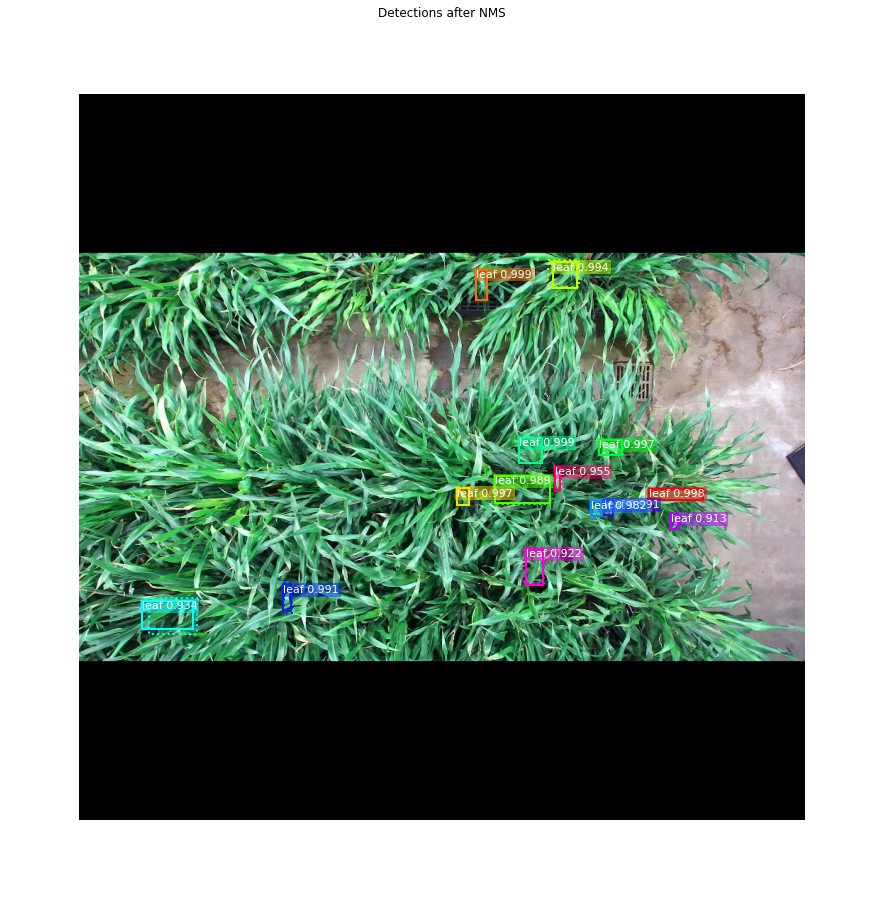

In [32]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

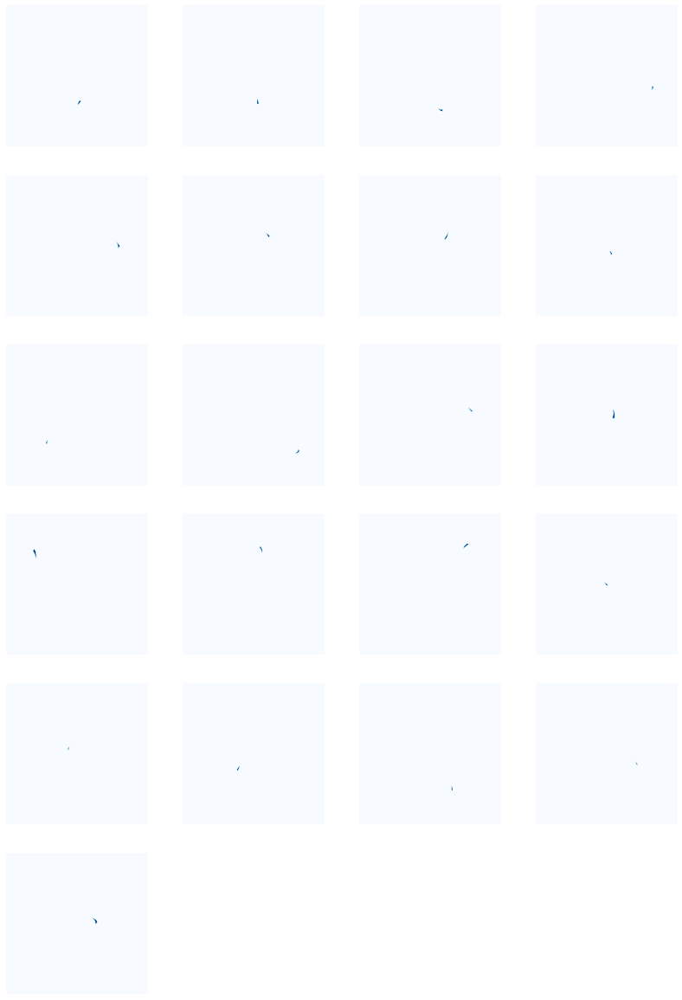

In [33]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [34]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    0.99999  float32
14 detections: ['leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf' 'leaf'
 'leaf' 'leaf' 'leaf' 'leaf']


In [35]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (14, 28, 28)          min:    0.00000  max:    0.99999  float32
det_masks                shape: (14, 1024, 1024)      min:    0.00000  max:    1.00000  bool


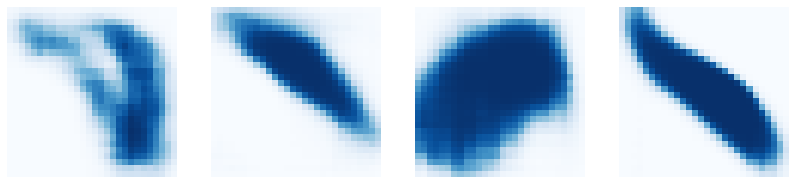

In [36]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

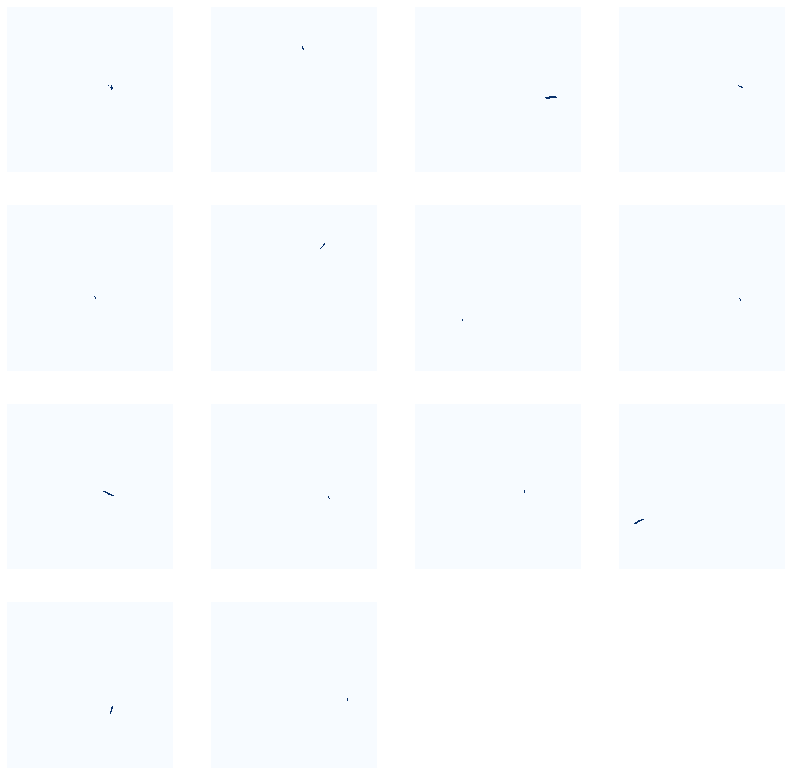

In [37]:
display_images(det_masks[:] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [38]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
res2c_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   44.07818  float32
res3c_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   32.93615  float32
res4w_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   65.96967  float32
rpn_bbox                 shape: (1, 261888, 4)        min:   -8.68156  max:   33.17333  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    0.96453  float32


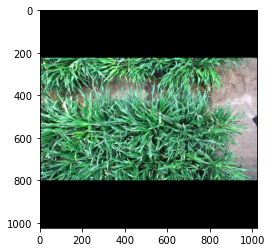

In [39]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

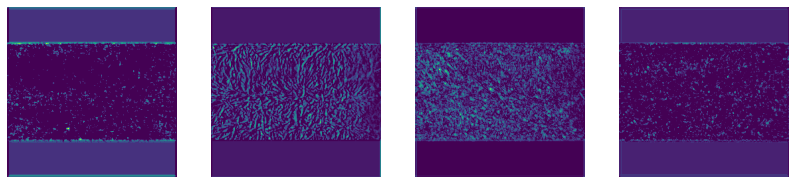

In [40]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)

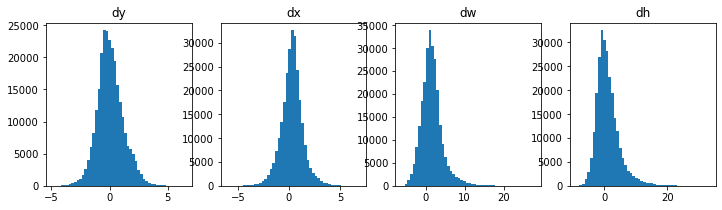

In [41]:
# Histograms of RPN bounding box deltas
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

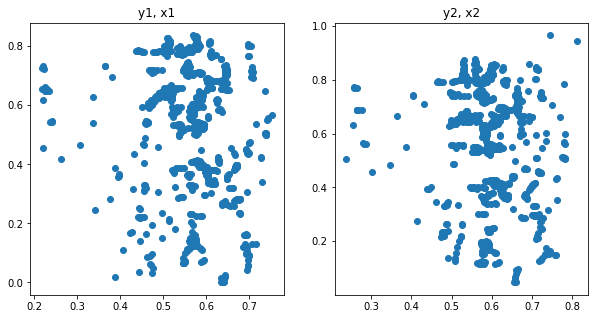

In [42]:
# Distribution of y, x coordinates of generated proposals
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()